In [22]:
import numpy as np
import tensorflow as tf

print(np.__version__)
print(tf.__version__)

1.26.4
2.10.0


In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
from tensorflow.keras import layers

from PIL import Image
import glob
import time
from tqdm.notebook import tqdm

import cv2
import random

In [2]:
# from tensorflow.keras import mixed_precision
# mixed_precision.set_global_policy('mixed_float16')

In [3]:
train_path = 'D:/Download/archive/dataset/train/*.jpg'  # Adjust the pattern based on your image format
val_path = 'D:/Download/archive/dataset/test/*.jpg'
# Get all image paths
train_paths = glob.glob(train_path)
val_paths = glob.glob(val_path)

# Check the number of images
print(f"Total images found: train {len(train_paths)} & test:{len(val_paths)}")

Total images found: train 8227 & test:2056


255 0 (168, 300, 3)
D:/Download/archive/dataset/train\cb675291c4.jpg
255 0 (168, 300, 3)
D:/Download/archive/dataset/train\ac3ed80fbe.jpg
255 0 (362, 640, 3)
D:/Download/archive/dataset/train\f3c30103a7.jpg
255 0 (522, 365, 4)
D:/Download/archive/dataset/train\c3.jpg


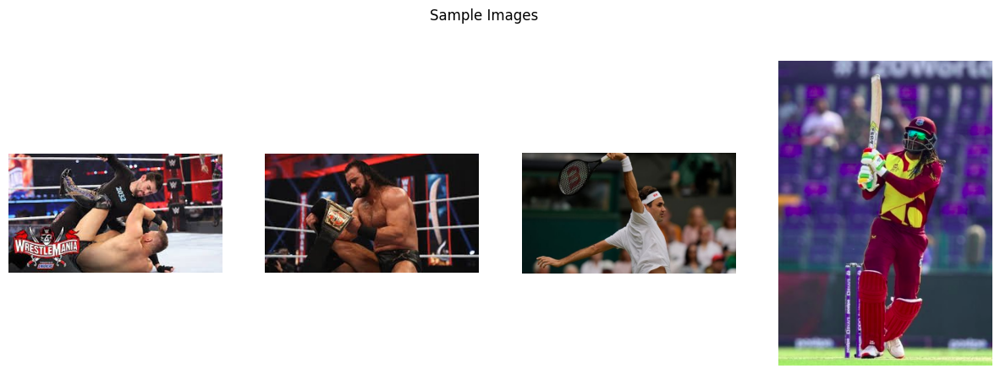

In [4]:
fig, axs = plt.subplots(1, 4, figsize=(15, 5))  # Optionally specify the figure size

for i in range(4):
    ind = np.random.randint(0, 8227)
    image = Image.open(train_paths[ind])
    print(np.array(image).max(), np.array(image).min(),np.array(image).shape)
    print(train_paths[ind])
    axs[i].imshow(image)
    axs[i].axis('off')  #Turn off axis for each subplot

plt.suptitle("Sample Images")  # Set the title for the entire figure
plt.show()

In [5]:
def parse_image(path, split):
    image = Image.open(path)
    image = image.resize((256, 256), Image.BICUBIC)
    if image.mode == 'RGBA':
        image = image.convert('RGB')
    if split=="train" and random.random() > 0.5:
        image = image.transpose(Image.FLIP_LEFT_RIGHT)
    #process requiring numpy array
    image = np.array(image)
    lab_image = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    L, A, B = cv2.split(lab_image)
    AB = np.stack((A, B), axis=-1)
    L = (L-127.5)/127.5
    AB = (AB-123.0)/103.0
    L = L[:, :, np.newaxis]
    
    L = L.astype(np.float32)
    AB = AB.astype(np.float32)
    return (L,AB)

# max/min of L channel:255/0
#max/min of AB 226 20
# shape of L and AB{(256, 256)} {(256, 256, 2)}

In [6]:
def load_data(paths,split):
    dataset = tf.data.Dataset.from_tensor_slices(paths)
    dataset = dataset.map(lambda path:tf.numpy_function(
        parse_image,[path,split],(tf.float32, tf.float32)))
    dataset = dataset.shuffle(buffer_size =4100) if split == "train" else dataset
    dataset = dataset.batch(12)
    dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)

    return dataset

In [7]:
train_dataset = load_data(train_paths, split='train')
val_dataset = load_data(val_paths, split='val')

# Check shapes of sample data
for data in train_dataset.take(1):
    L, ab = data
    print(L.shape, ab.shape)

print("len of train and val dataset:",len(train_dataset),len(val_dataset))

(12, 256, 256, 1) (12, 256, 256, 2)
len of train and val dataset: 686 172


In [8]:
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [9]:
class Discriminator(tf.keras.Model):
    def __init__(self, in_channels):
        super(Discriminator, self).__init__()
        layers = [self._block(in_channels, 64, bias=True)]
        for i in range(3):
            layers += [self._block(64*(2**i), 64*(2**(i+1)), stride=1 if i==2 else 2, bias=False)]
        layers += [self._block(64*(2**3),1,stride=1,bias=True, act=False)]
        self.model = tf.keras.Sequential(layers)

    def _block(self,in_channels, out_channels, stride=2, bias=True, act=True):
        layers = [tf.keras.layers.Conv2D(
                     filters=out_channels, 
                     kernel_size=4, 
                     strides=stride, 
                     padding="same", 
                     use_bias = bias
            )]
        if not bias:
            layers.append(tf.keras.layers.BatchNormalization())
        if act:
            layers.append(tf.keras.layers.LeakyReLU(alpha=0.2))
        return tf.keras.Sequential(layers)

    def call(self, x):
        return self.model(x)
        

In [10]:
class Block(tf.keras.layers.Layer):
    def __init__(self,in_channels, out_channels, down=True, act="lrelu", use_dropout=False):
        super(Block, self).__init__()
        if down:
            self.conv = layers.Conv2D(out_channels, kernel_size=4, strides=2, 
                padding="same", use_bias=False, kernel_initializer=tf.random_normal_initializer(0., 0.02)
            )
        else:
            self.conv = layers.Conv2DTranspose(out_channels, kernel_size=4, strides=2, 
                padding="same", use_bias=False, kernel_initializer=tf.random_normal_initializer(0., 0.02)
            )
            
        self.batchnorm = layers.BatchNormalization()
        if act == "relu":
            self.activation = layers.ReLU()
        else:
            self.activation = layers.LeakyReLU(0.2)

        self.use_dropout = use_dropout
        if use_dropout:
            self.dropout = layers.Dropout(0.25)

    def call(self, x, training=True):
        x = self.conv(x)
        x = self.batchnorm(x, training=training)
        x = self.activation(x)
        if self.use_dropout:
            x = self.dropout(x, training=training)
        return x


In [11]:
class Generator(tf.keras.Model):
    def __init__(self):
        super(Generator, self).__init__()
        self.initial_down = tf.keras.Sequential([
                    layers.Conv2D(filters=64, kernel_size=4, strides=2, padding="same",
                          use_bias=False, kernel_initializer=tf.random_normal_initializer(0., 0.02), input_shape=(256,256,1)),
                    layers.LeakyReLU(0.2)

        ])
        self.down1 = Block(64, 128)
        self.down2 = Block(128, 256)
        self.down3 = Block(256, 512)
        self.down4 = Block(512, 512)
        self.down5 = Block(512, 512)
        self.down6 = Block(512, 512)

        self.last =  tf.keras.Sequential([
            layers.Conv2D(filters=512, kernel_size=4, strides=2, padding="same",
                          use_bias=False, kernel_initializer=tf.random_normal_initializer(0., 0.02)),
            layers.BatchNormalization(),
            layers.LeakyReLU(0.2),
            layers.Conv2DTranspose(filters=512, kernel_size=4, strides=2, padding="same",
                                  use_bias=False,kernel_initializer=tf.random_normal_initializer(0., 0.02)),
            layers.BatchNormalization(),
            layers.ReLU()
        ])                                                #2*2

        self.up1 = Block(1024,512,down=False,act="relu")  #4*4
        self.up2 = Block(1024,512,down=False,act="relu")  #8*8
        self.up3 = Block(1024,512,down=False,act="relu")  #16*16
        self.up4 = Block(1024,256,down=False,act="relu")  #32*32
        self.up5 = Block(512,128,down=False,act="relu")   #64*64
        self.up6 = Block(256,64,down=False,act="relu")    #128*128

        self.final_up = tf.keras.Sequential([
              layers.Conv2DTranspose(filters=2, kernel_size=4, strides=2, padding="same",
                                  kernel_initializer=tf.random_normal_initializer(0., 0.02)),
            layers.Activation("tanh")
        ])


    def call(self,x):
        d = self.initial_down(x)
        d1 = self.down1(d) #128*64*64
        d2 = self.down2(d1) #256*32*32
        d3 = self.down3(d2) #512*16*16
        d4 = self.down4(d3) #512*8*8
        d5 = self.down5(d4) #512*4*4
        d6 = self.down6(d5)
        last = self.last(d6)
        u1 = self.up1(tf.concat([d6,last], axis=-1)) #1024*2*2===>512*4*4
        u2 = self.up2(tf.concat([d5,u1], axis=-1))  #1024*4*4===>512*8*8
        u3 = self.up3(tf.concat([d4,u2], axis=-1))  #1024*8*8===>512*16*16
        u4 = self.up4(tf.concat([d3,u3], axis=-1))  #1024*16*16===>256*32*32
        u5 = self.up5(tf.concat([d2,u4], axis=-1))  #512*32*32===>128*64*64
        u6 = self.up6(tf.concat([d1,u5], axis=-1))  #256*64*64===>64*128*128
        return self.final_up(tf.concat([d,u6], axis=-1))
        
            

In [12]:
discriminator = Discriminator(in_channels=3)
discriminator.build(input_shape=(None, 256, 256, 3))

# Print the model summary
discriminator.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_5 (Sequential)   (None, 32, 32, 1)         2767425   
                                                                 
Total params: 2,767,425
Trainable params: 2,765,633
Non-trainable params: 1,792
_________________________________________________________________


In [13]:
generator = Generator()
generator.build(input_shape=(None, 256, 256, 1))

# Print the model summary
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_6 (Sequential)   (None, 128, 128, 64)      1024      
                                                                 
 block (Block)               multiple                  131584    
                                                                 
 block_1 (Block)             multiple                  525312    
                                                                 
 block_2 (Block)             multiple                  2099200   
                                                                 
 block_3 (Block)             multiple                  4196352   
                                                                 
 block_4 (Block)             multiple                  4196352   
                                                                 
 block_5 (Block)             multiple                  41

In [72]:
def generate_and_save_images(generator, epoch, val_dataset):
    # Get one batch from the validation dataset
    L_images, AB_images = next(iter(val_dataset))
    predictions = generator(L_images, training=False)
    
    # Convert TensorFlow tensors to NumPy arrays
    L_images = L_images.numpy()
    AB_images = AB_images.numpy()
    predictions = predictions.numpy()
    L_images = np.nan_to_num(L_images)
    AB_images = np.nan_to_num(AB_images)
    predictions = np.nan_to_num(predictions)
    L_images = (L_images + 1) * 127.5
    AB_images = (AB_images * 103.0) + 123.0
    predictions = (predictions * 103.0) + 123.0
    org = np.concatenate([L_images, AB_images], axis=-1)
    org = org.astype(np.uint8)
    pred = np.concatenate([L_images, predictions], axis=-1)
    pred = pred.astype(np.uint8)
    org_images = []
    pred_images = []
    l_images = []
    for i in range(4):
        ind = random.randint(0,11)
        org_images.append(cv2.cvtColor(org[ind], cv2.COLOR_LAB2RGB))
        pred_images.append(cv2.cvtColor(pred[ind], cv2.COLOR_LAB2RGB))
        l_images.append(L_images[ind])

    print(f"for epoch number: {epoch}")
    fig, axs = plt.subplots(3, 4, figsize=(12, 9))  # 3 rows, 4 columns

    # Plot L channel images
    for i in range(4):
        axs[0, i].imshow(l_images[i], cmap='gray')
        axs[0, i].axis('off')
        axs[0, i].set_title("L Image")

    for i in range(4):
        axs[1, i].imshow(org_images[i])
        axs[1, i].axis('off')  # Hide axes
        axs[1, i].set_title(f"Original {i+1}")

#     # Plot original AB channel images
    for i in range(4):
        axs[2, i].imshow(pred_images[i])
        axs[2, i].axis('off')  # Hide axes
        axs[2, i].set_title(f"Predicted {i+1}")

    plt.tight_layout()
    plt.show()

In [15]:
opt_gen = tf.keras.optimizers.Adam(learning_rate=2e-4,beta_1=0.5,beta_2=0.999)
opt_disc = tf.keras.optimizers.Adam(learning_rate=2e-4,beta_1=0.5,beta_2=0.999)

# opt_disc = mixed_precision.LossScaleOptimizer(opt_disc)
# opt_gen = mixed_precision.LossScaleOptimizer(opt_gen)

# Define the loss function with from_logits=True
bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
l1_loss =  tf.keras.losses.MeanAbsoluteError()

In [16]:
@tf.function
def train_step(x,y):

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        y_fake = generator(x, training=True)
        D_real = discriminator(tf.concat([x, y], axis=-1), training=True)
        D_real_loss = bce(tf.ones_like(D_real), D_real)

        D_fake = discriminator(tf.concat([x, y_fake], axis=-1), training=True)
        D_fake_loss = bce(tf.zeros_like(D_fake), D_fake)
        D_loss = (D_real_loss + D_fake_loss) / 2
        # scaled_D_loss = opt_disc.get_scaled_loss(D_loss)

        G_fake_loss = bce(tf.ones_like(D_fake), D_fake)
        L1 = l1_loss(y, y_fake) * 100
        G_loss = G_fake_loss + L1
        # scaled_G_loss = opt_gen.get_scaled_loss(G_loss)


    disc_grads = disc_tape.gradient(D_loss, discriminator.trainable_variables)
    opt_disc.apply_gradients(zip(disc_grads, discriminator.trainable_variables))

    gen_grads = gen_tape.gradient(G_loss, generator.trainable_variables)
    opt_gen.apply_gradients(zip(gen_grads, generator.trainable_variables))


In [17]:
def train(dataset, epochs):
    for epoch in range(epochs):
        for idx, (x, y) in enumerate(dataset):
            train_step(x,y)
        
        generate_and_save_images(generator,
                             epoch + 1,
                             val_dataset)
    generate_and_save_images(generator,
                       epochs,
                       val_dataset)

for epoch number: 1


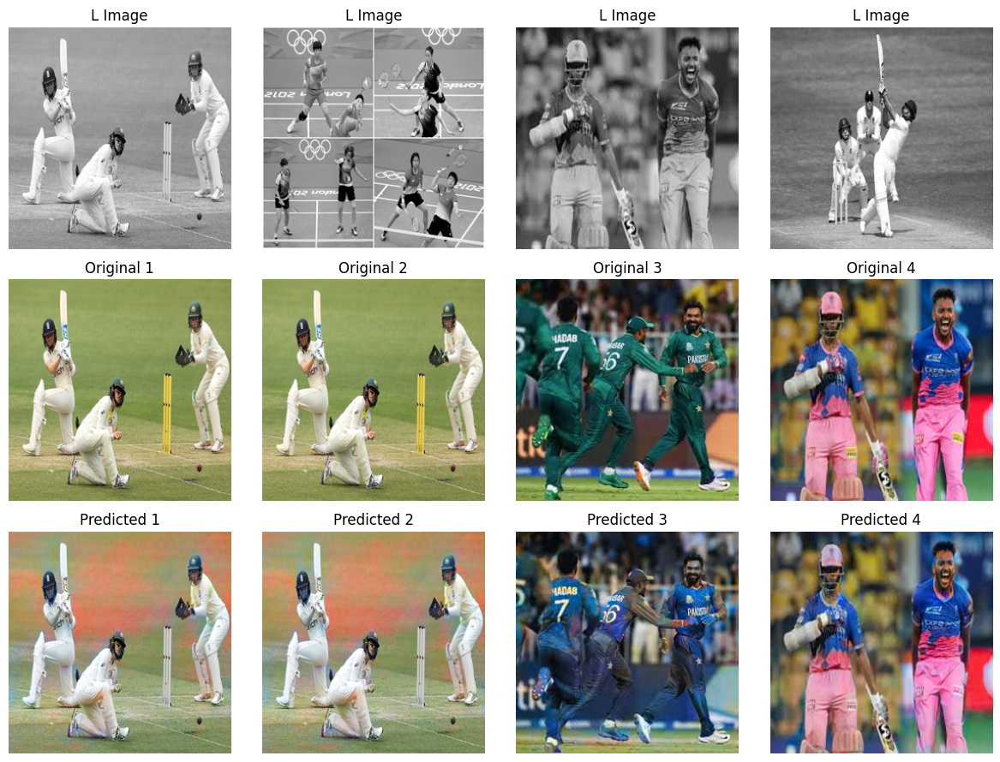

for epoch number: 2


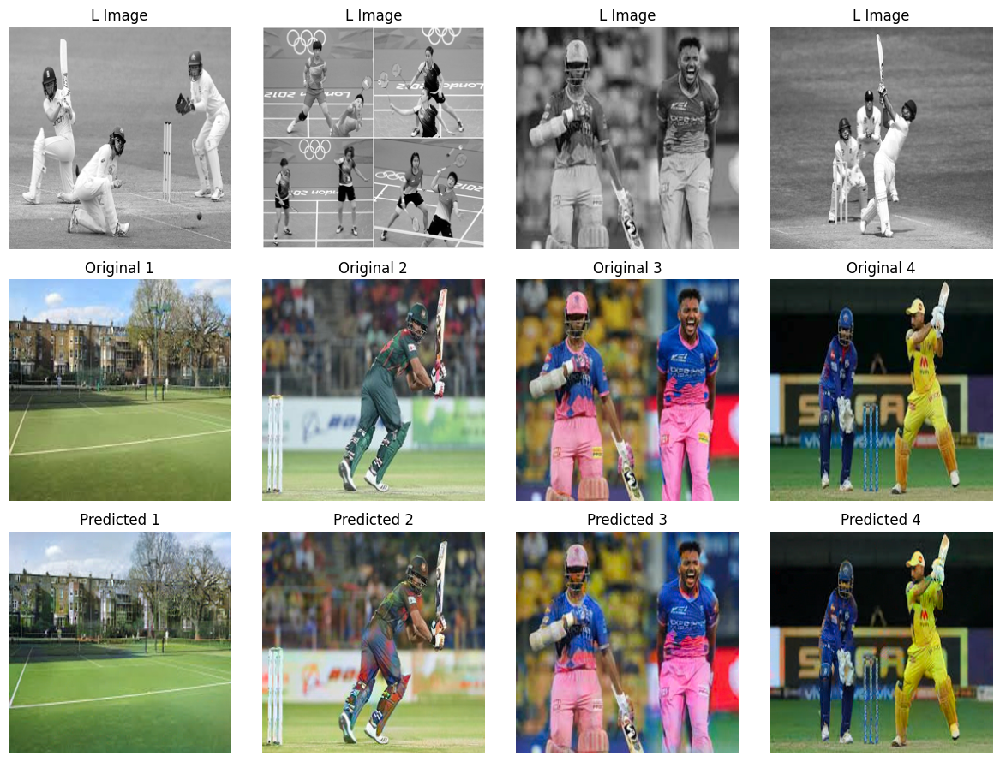

for epoch number: 3


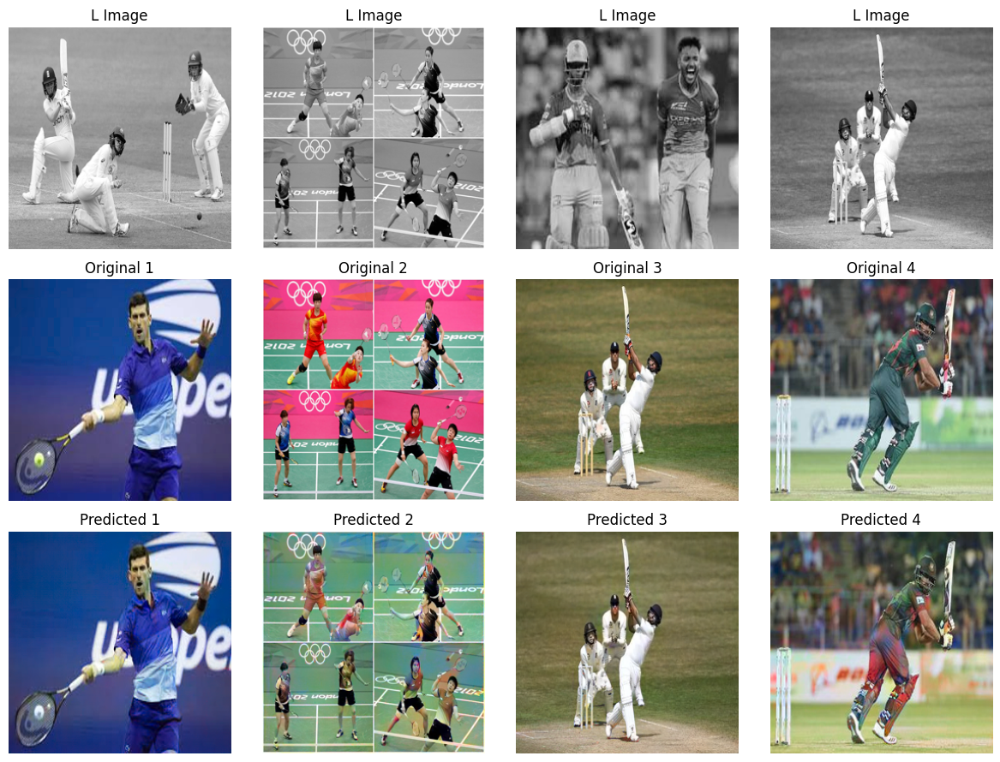

for epoch number: 4


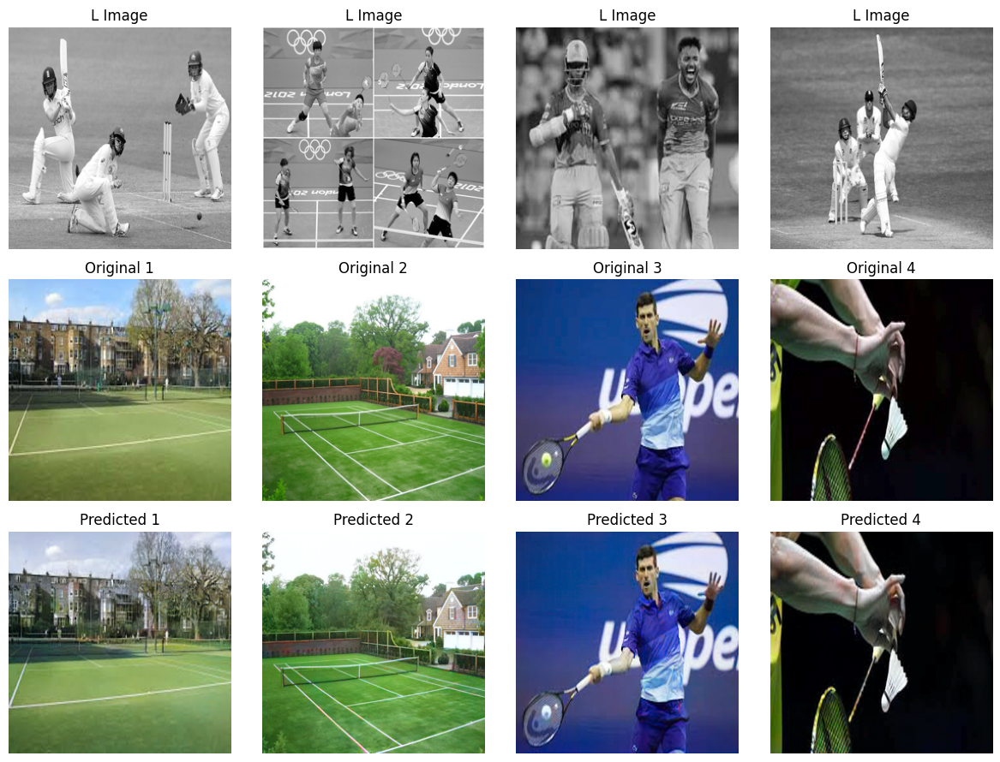

for epoch number: 5


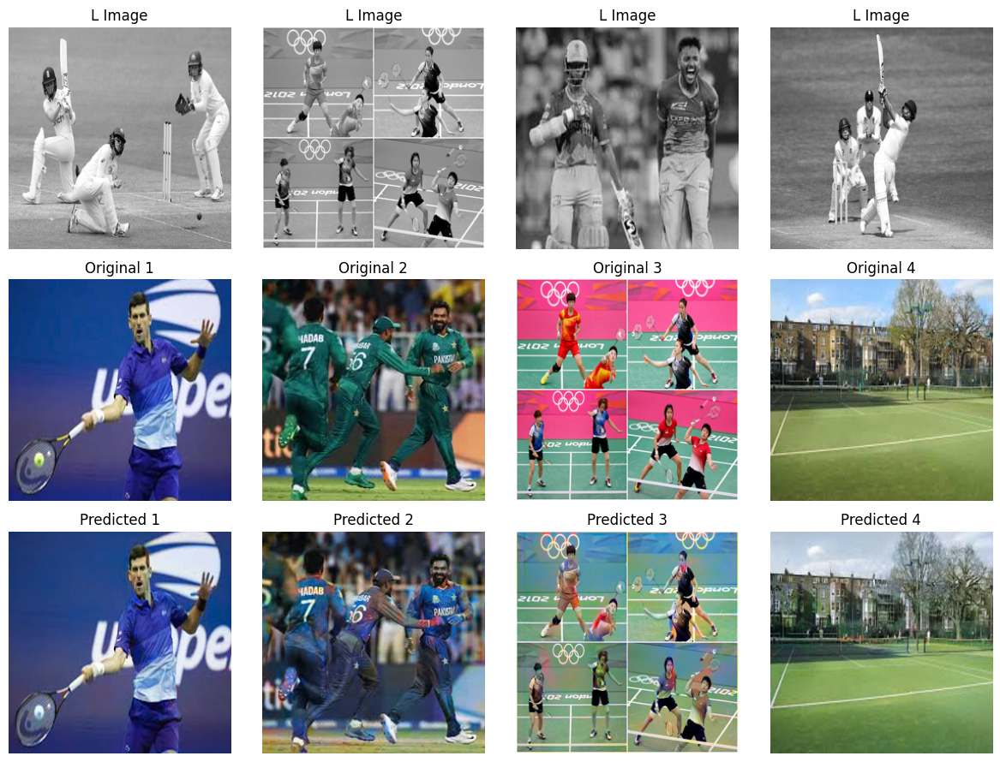

for epoch number: 6


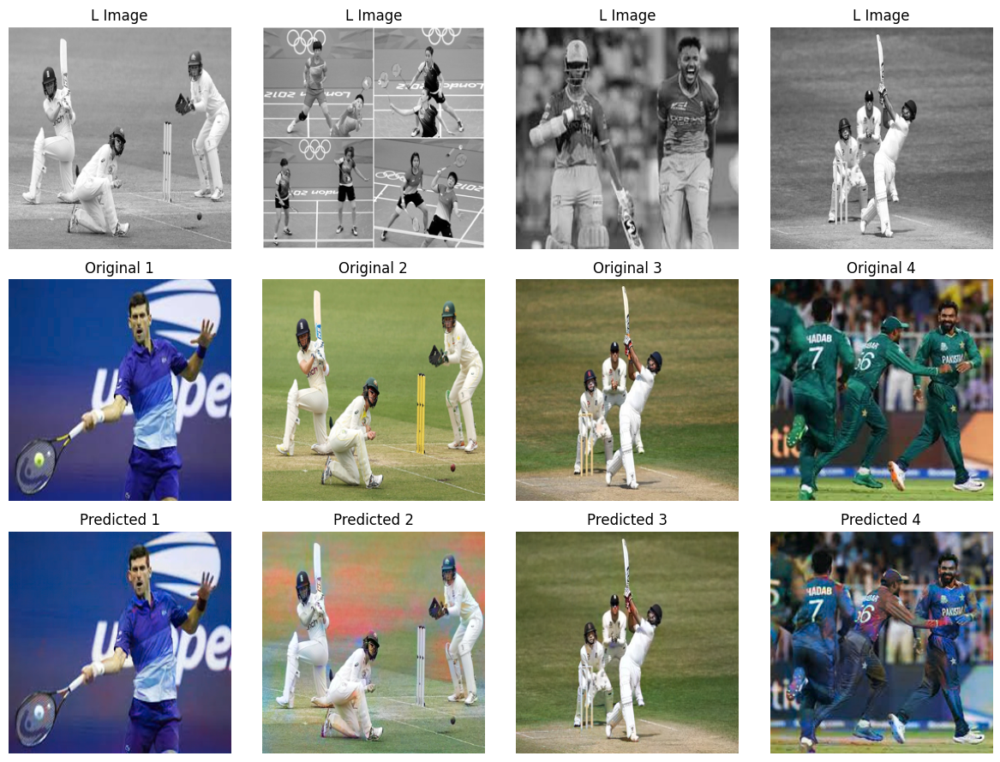

for epoch number: 7


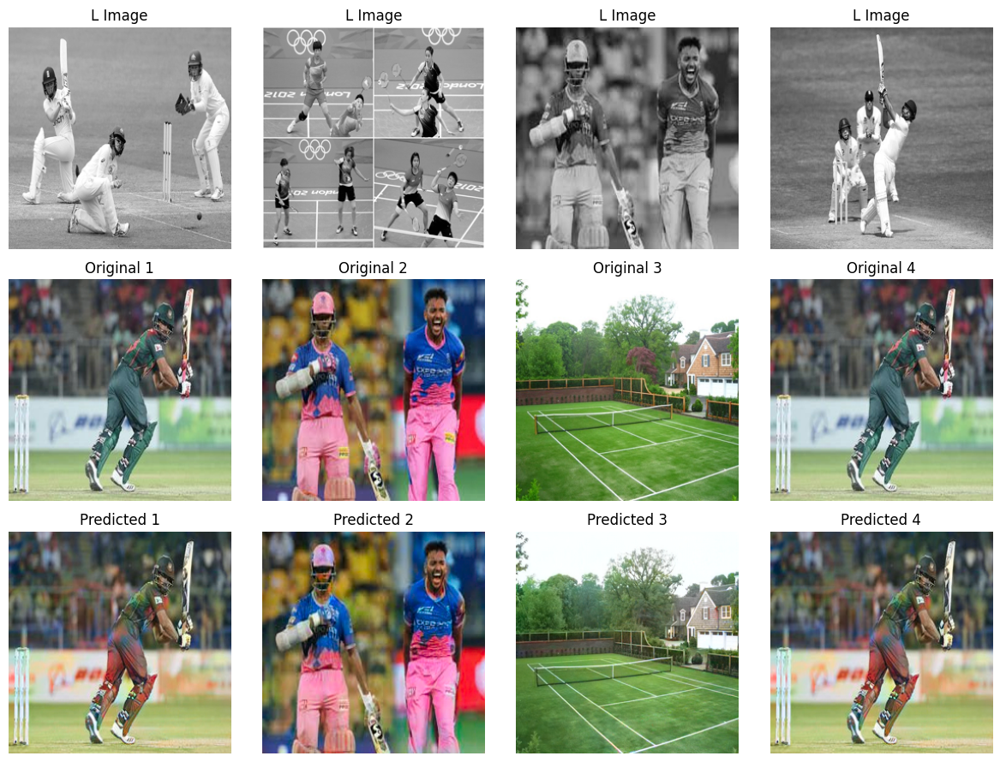

In [ ]:
train(train_dataset, 80)

for epoch number: 1


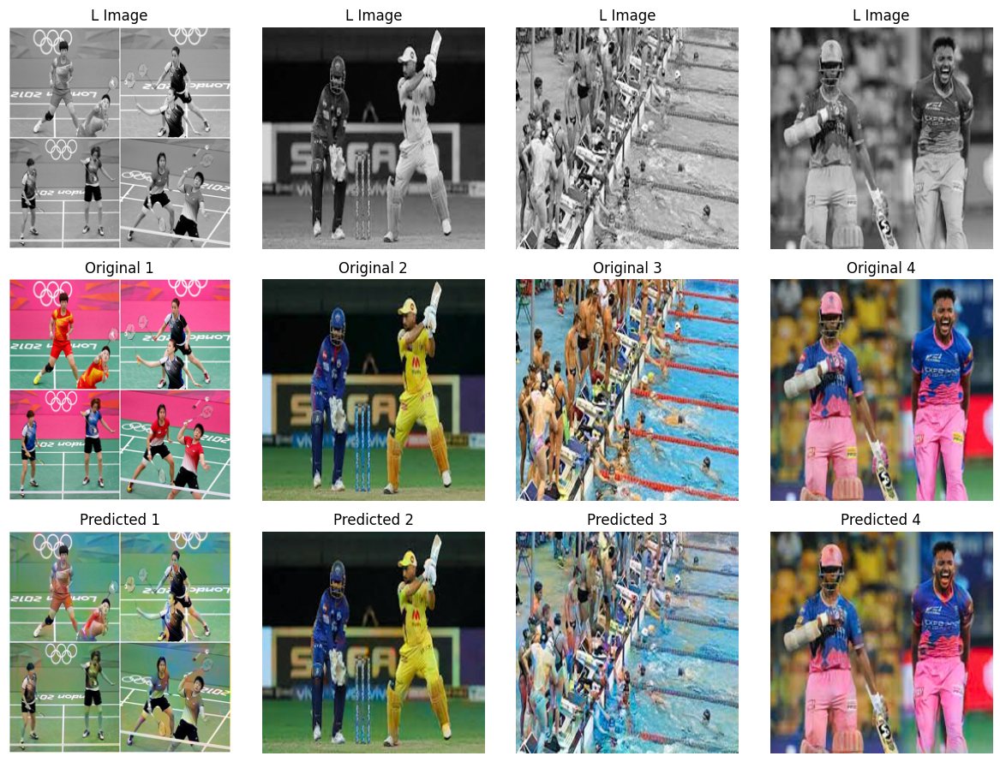

In [75]:
generate_and_save_images(generator,
                       1,
                       val_dataset)

Normal Backpropagation Process:
During backpropagation, the neurons that were "dropped out" (i.e., set to zero) during the forward pass do not contribute to the gradient calculations.
The weights and biases connected to those deactivated neurons do not receive updates for that training step since their activations are zero.
The rest of the network continues with the normal backpropagation process.

Dropout only affects activations functions of the layers and not weight and biases by randomly setting some of them to zero during training.
It does not modify weights, biases, or interfere with their updates.
The backpropagation process is normal for neurons that remain active. The deactivated neurons do not contribute to the gradient calculation in that training step.
Dropout’s main effect is to introduce regularization by randomly dropping neurons, encouraging the network to rely on multiple pathways and preventing overfitting.